# Style Transfer

Style image:
- https://www.erinhanson.com/p/Colors_of_Aspen
- https://www.superprof.com/blog/wp-content/uploads/2019/05/history-of-painting-1060x771.jpg

In [1]:
import os
import time
import itertools

import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow_datasets as tfds

import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

import PIL
import IPython.display as display

In [2]:
class MC:
    content_layers = ['block5_conv2'] 
    style_layers = ['block1_conv1',
                    'block2_conv1',
                    'block3_conv1', 
                    'block4_conv1', 
                    'block5_conv1']

    
class DC:
    dataset = '/tf/datasets/style-transfer'
    image_size = (512, 512)
    extractor_receptor_field = (224, 224)

class Config:
    data = DC
    model = MC
    
    use_hub = True

## Setup

In [3]:
sns.set()

In [4]:
def plot(y, titles=None, rows=1, i0=0, full=False):
    from math import ceil
    if full: plt.figure(figsize=(16, 9))
    for i, image in enumerate(y):
        if image is None:
            plt.subplot(rows, ceil(len(y) / rows), i0+i+1)
            plt.axis('off')
            continue
        t = titles[i] if titles else None
        plt.subplot(rows, ceil(len(y) / rows), i0+i+1, title=t)
        plt.imshow(image)
        plt.axis('off')
    if full: plt.tight_layout()

In [5]:
@tf.function
def load_image(path_to_img):
    x = tf.io.read_file(path_to_img)
    x = tf.image.decode_jpeg(x, channels=3)
    x = tf.image.resize(x, Config.data.image_size, preserve_aspect_ratio=True)

    return x

def prepare(ds):
    return (tf.data.Dataset.from_tensor_slices(ds).map(load_image)
            .cache()
            .prefetch(tf.data.AUTOTUNE))

def as_sample(x):
    return x[tf.newaxis, ...] / 255.

def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor)>3:
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

## Dataset

In [6]:
class Data:
    content = [Config.data.dataset + '/content/' + c
               for c in os.listdir(Config.data.dataset + '/content')]
    styles = [Config.data.dataset + '/style/' + s
              for s in os.listdir(Config.data.dataset + '/style')]
    content, styles = map(prepare, (content, styles))

In [7]:
content = [c for c in Data.content]
styles = [s for s in Data.styles]

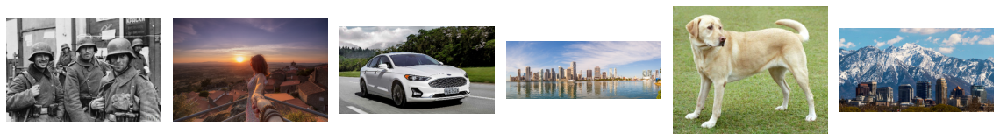

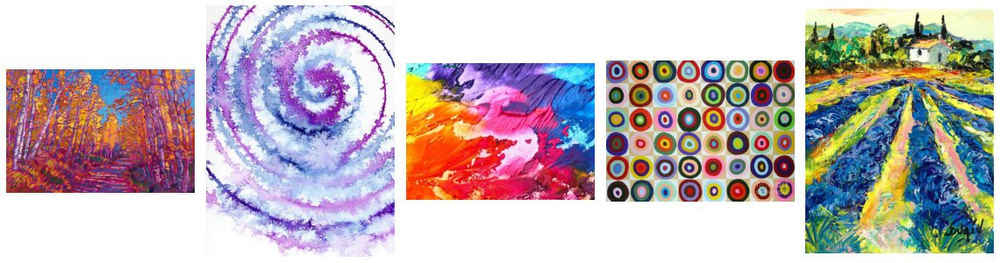

In [8]:
plot([x / 255 for x in content], full=True)
plot([x / 255 for x in styles], full=True)

## Hub

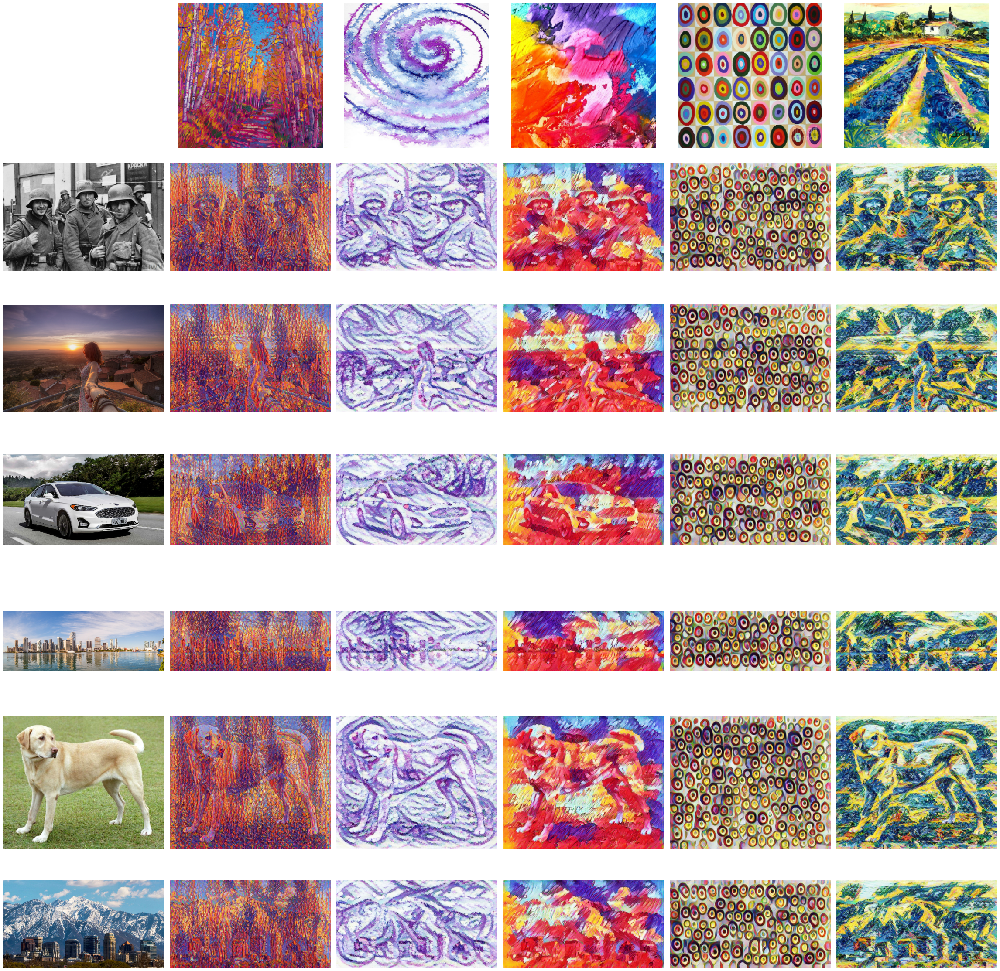

In [9]:
if Config.use_hub:
    import tensorflow_hub as hub
    hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
    
    sts = [tf.image.resize(s, (256, 256)) for s in styles]  # necessary for this model
    
    g = [hub_model(as_sample(c), as_sample(s))[0][0]
         for c, s in itertools.product(content, sts)]

    # Add a content image in the first col of every row of the grid:
    for ix, c in enumerate(content):
        g.insert(ix * len(styles) + ix, c/255)

    plt.figure(figsize=(32, 32))
    plot([None, *(s/255 for s in sts), *g], rows=len(content) + 1)
    plt.tight_layout();
    
    del hub_model, g

## Style Transfer

In [10]:
extractor = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
pre_fn = tf.keras.applications.vgg19.preprocess_input

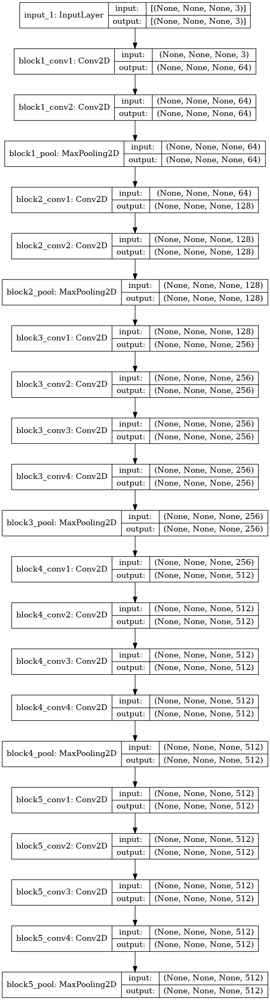

In [11]:
tf.keras.utils.plot_model(extractor, to_file='vgg19.png', show_shapes=True)

### Defining Model

In [12]:
def gram_matrix(x):
    y = tf.linalg.einsum('bijc,bijd->bcd', x, x)
    s = tf.shape(x)
    size = tf.cast(s[1]*s[2], tf.float32)
    return y / size

In [13]:
from tensorflow.keras import Model

class StyleTransfer(Model):
    def __init__(self, extractor, content_layers, style_layers, *args, **kwargs):
        super().__init__()

        outs = {l: extractor.get_layer(l).output for l in content_layers + style_layers}
        submodel = Model(extractor.input, outs, name='extractor_sc')
        submodel.trainable = False
        self.extractor = submodel
        self.cl = content_layers
        self.sl = style_layers

    def call(self, inputs):
        x = pre_fn(inputs * 255)
        outputs = self.extractor(x)
        
        return {'content': {l: outputs[l] for l in self.cl},
                'style': {l: gram_matrix(outputs[l]) for l in self.sl}}

st = StyleTransfer(extractor,
                   Config.model.content_layers,
                   Config.model.style_layers)

In [14]:
content_image = as_sample(tf.image.resize(content[4], Config.data.image_size))
style_image = as_sample(styles[2])
style_image = tf.image.resize(style_image, (224, 224))
image = tf.Variable(content_image)

content_targets = st(content_image)['content']
style_targets = st(style_image)['style']

print('Resulting tensors:')
print('Content:', *(f'{n}: {l.shape}' for n, l in content_targets.items()), sep='\n  - ')
print('Style:', *(f'{n}: {l.shape}' for n, l in style_targets.items()), sep='\n  - ')

Resulting tensors:
Content:
  - block5_conv2: (1, 32, 32, 512)
Style:
  - block1_conv1: (1, 64, 64)
  - block2_conv1: (1, 128, 128)
  - block3_conv1: (1, 256, 256)
  - block4_conv1: (1, 512, 512)
  - block5_conv1: (1, 512, 512)


In [15]:
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

style_w = 1e-2
content_w = 1e4

In [16]:
def style_content_loss(outputs):
    so = outputs['style']
    co = outputs['content']
    sl = tf.add_n([tf.reduce_mean((so[l]-style_targets[l])**2) for l in so.keys()])
    cl = tf.add_n([tf.reduce_mean((co[l]-content_targets[l])**2) for l in co.keys()])

    return content_w * cl / len(co) + style_w * sl / len(so)

In [17]:
@tf.function
def train_step(x):
    with tf.GradientTape() as tape:
        outputs = st(x)
        loss = style_content_loss(outputs)

    grad = tape.gradient(loss, x)
    opt.apply_gradients([(grad, x)])
    x.assign(tf.clip_by_value(x, 0, 1.))

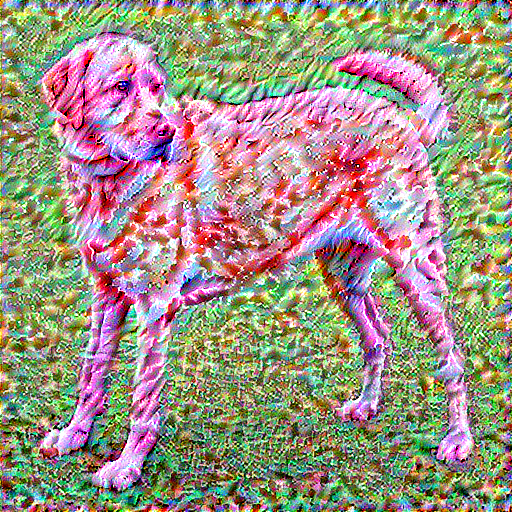

Total time: 9.9 seconds


In [18]:
epochs = 10
steps_per_epoch = 10

start = time.time()
global_step = 0

for epoch in range(epochs):
    for step in range(steps_per_epoch):
        train_step(image)
        print('.', end='')
        global_step += 1
    display.clear_output(wait=True)
    display.display(tensor_to_image(image))

end = time.time()
print("Total time: {:.1f} seconds".format(end-start))